### Get final results from all the runs

In [ ]:
import json
import os
import numpy as np


folder_path_10runs = '/content/drive/MyDrive/Colab Notebooks/7__emotion_augmentation/1__results/1b_dataset_x3_low_range_all_stats'

# new batch 64 lr 00005
#folder_path_10runs = '/content/drive/MyDrive/Colab Notebooks/7__emotion_augmentation/1__results/1b_dataset_x3_low_range_all_stats/multiple'




#AUGM_TECHNIQUES = ['pitch_shift', 'time_stretch', 'reverb', 'noise', 'random_gain', 'no_augmentation']

#AUGM_TECHNIQUES = ['no_augm_x3', 'no_aug_x1', 'compressor', 'high_pass', 'low_pass', 'noise', 'pitch_shift', 'random_gain', 'resampling', 'reverb', 'saturation', 'time_shift', 'time_stretch', 'time_stretch_extended', 'multiple_1', 'multiple_2', 'multiple_3']
#RANGES =          [(0, 0), (0, 0), (1, 4), (200, 2000), (500, 5000), (0, 0.05), (-3, 3), (0.8, 1.2), (11025, 22050), (0, 0.1), (0, 20), (0, 1.5), (0.97, 1), (0.97, 1.03), (0, 0), (0, 0), (0, 0)]


#AUGM_TECHNIQUES = ['no_augm_x3', 'compressor', 'high_pass', 'low_pass', 'noise', 'pitch_shift', 'random_gain', 'resampling', 'reverb', 'saturation', 'time_shift', 'time_stretch_extended']
#RANGES =          [(0, 0), (1, 4), (200, 2000), (500, 5000), (0, 0.05), (-3, 3), (0.8, 1.2), (11025, 22050), (0, 0.1), (0, 20), (0, 1.5), (0.97, 1.03)]

AUGM_TECHNIQUES = ['no augmentation', 'multiple_1', 'multiple_2', 'multiple_3']
RANGES =          [(0,0), (0, 0), (0, 0), (0, 0)]

augment_results = {

    'augmentation': AUGM_TECHNIQUES,
    'ranges': RANGES,

    'song_acc': [],
    'song_std': [],
    'segm_acc': [],
    'segm_std':[]
}


# function
def get_accuracy_and_std_from_string(text, verbose=False):

  # get song and segment lines
  song_line = single_run.split('\n')[4]
  segm_line = single_run.split('\n')[5]

  # find song and segment accuracy
  song_acc = round( float( song_line.split('song: ')[1][:6] ), 5 )
  segm_acc = round( float( segm_line.split('segm: ')[1][:6] ), 5 )

  #find song and segment std
  song_std = round( float( song_line.split('std: ')[1][:6] ), 5 )
  segm_std = round( float( segm_line.split('std: ')[1][:6] ), 5 )

  if verbose:

    print( f'acc segm (std): {segm_acc} ({segm_std})')
    print( f'acc song (std): {song_acc} ({song_std})')

  return song_acc, song_std, segm_acc, segm_std



# main
for i, (path, folders, files) in enumerate(os.walk(folder_path_10runs)):

  # to not consider the folder in 1_results that contains other material
  if path is folder_path_10runs:

    print(path, files, end='\n\n')


    # sort files alphabetically
    sorted_files = sorted(files)

    # see names
    #for file_name_ in sorted_files:
    #  print(file_name_)


    # iterate through all the files
    for file_name, augm_tech in zip(sorted_files, augment_results['augmentation']):

      # verify correspondence technique .json file
      print(augm_tech, file_name)





      # get complete path of each .json file
      file_path = os.path.join(path, file_name)

      # open file, get data and store in a list
      with open(file_path, 'r') as f:
        data = json.load(f)

      song_acc_list = []
      segm_acc_list = []


      # get accuracy (std) for song and segments
      for single_run in data:

        print(single_run)

        # save all the accuracies for a specific tecnique
        song_acc, song_std, segm_acc, segm_std = get_accuracy_and_std_from_string(single_run, verbose=True)
        song_acc_list.append(song_acc)
        segm_acc_list.append(segm_acc)

      # get mean and std and store
      print(segm_acc_list)
      print(song_acc_list)

      song_acc_mean = np.mean(song_acc_list)
      song_acc_std  = np.std(song_acc_list)

      segm_acc_mean = np.mean(segm_acc_list)
      segm_acc_std  = np.std(segm_acc_list)
      print(f'resuls song: {song_acc_mean} (std: {song_acc_std})')
      print(f'resuls segm: {segm_acc_mean} (std: {segm_acc_std})', end='\n\n')

      # save in the dictionary
      augment_results['song_acc'].append(song_acc_mean)
      augment_results['song_std'].append(song_acc_std)

      augment_results['segm_acc'].append(segm_acc_mean)
      augment_results['segm_std'].append(segm_acc_std)







/content/drive/MyDrive/Colab Notebooks/7__emotion_augmentation/1__results/1b_dataset_x3_low_range_all_stats ['dataset_x3_10RUN_pitch_shift_range_(-3, 3)_3fold_stratif_grouped_random_st_1.json', 'dataset_x3_10RUN_reverb_range_(0, 0.1)_3fold_stratif_grouped_random_st_1.json', 'dataset_x3_10RUN_noise_range_(0, 0.05)_3fold_stratif_grouped_random_st_1.json', 'dataset_x3_10RUN_random_gain_range_(0.8, 1.2)_3fold_stratif_grouped_random_st_1.json', 'a_new_dataset_x3_10RUN_no_augmentation_range_(0, 0)_3fold_stratif_grouped_random_st_1.json', 'dataset_x3_10RUN_saturation_range_(0, 20)_3fold_stratif_grouped_random_st_1.json', 'dataset_x3_10RUN_time_shift_range_(0, 1.5)_3fold_stratif_grouped_random_st_1.json', 'dataset_x3_10RUN_low_pass_range_(500, 5000)_3fold_stratif_grouped_random_st_1.json', 'dataset_x3_10RUN_high_pass_range_(200, 2000)_3fold_stratif_grouped_random_st_1.json', 'dataset_x3_10RUN_compressor_range_(1, 4)_3fold_stratif_grouped_random_st_1.json', 'dataset_x3_10RUN_resampling_range_(1

In [ ]:
from pprint import pprint
pprint( augment_results, sort_dicts=False)

{'augmentation': ['no augmentation', 'multiple_1', 'multiple_2', 'multiple_3'],
 'ranges': [(0, 0), (0, 0), (0, 0), (0, 0)],
 'song_acc': [0.55188, 0.56904, 0.55591, 0.57454],
 'song_std': [0.027565804903902234,
              0.01354364795762205,
              0.01597475821413269,
              0.012528383774453932],
 'segm_acc': [0.47508999999999996,
              0.47572000000000003,
              0.47819,
              0.48252999999999996],
 'segm_std': [0.010118048230760712,
              0.010840922469974588,
              0.012723006720111408,
              0.009747620222392743]}


In [ ]:
#store_path_10runs = '/content/drive/MyDrive/Colab Notebooks/7__emotion_augmentation/1__results/1__results_10RUN_dataset_x3.json'
store_path_low_range = '/content/drive/MyDrive/Colab Notebooks/7__emotion_augmentation/1__results/1__results_10RUN_dataset_x3_low_range_ordered_original_hyperparam_multiple_PAPER.json'

with open(store_path_low_range, 'w') as f:
  json.dump(augment_results, f, indent=4)

### Plot

In [ ]:
import json
from pprint import pprint
import matplotlib.pyplot as plt
import numpy as np
'''
#path_low = '/content/drive/MyDrive/Colab Notebooks/7__emotion_augmentation/1__results/1__compact_results/1__results_10RUN_dataset_x3_low_range_ordered.json'
#path_high = '/content/drive/MyDrive/Colab Notebooks/7__emotion_augmentation/1__results/1__compact_results/2__results_10RUN_dataset_x3_high_range_ordered.json'


# get data
with open(path_low, 'r') as f:
  data_low = json.load(f)

with open(path_high, 'r') as f:
  data_high = json.load(f)'''

#path = '/content/drive/MyDrive/Colab Notebooks/7__emotion_augmentation/1__results/1__compact_results/1__results_10RUN_dataset_x3_low_range_ordered_original_hyperparam_PAPER.json'
path = '/content/drive/MyDrive/Colab Notebooks/7__emotion_augmentation/1__results/1__results_10RUN_dataset_x3_low_range_ordered_original_hyperparam_multiple_PAPER.json'

with open(path, 'r') as f:
  data = json.load(f)

In [ ]:

def plot_segm_song_acc_std(x_labels, song_accs, song_stds, segm_accs, segm_stds, ylim=(0.3, 0.65), no_std=False, save_path=False):

  bar_width = 0.4


  color_a = 'yellowgreen'
  color_b = 'olivedrab'

  color_1 = '#1f77b4'  # Standard blue
  color_2 = '#aec7e8'  # Lighter shade of blue

  #plt.figure(figsize=(11, 6))

  plt.figure(figsize=(8, 5))

  if no_std==False:
    plt.bar(np.arange(len(x_labels)) + bar_width/2, song_accs, bar_width, yerr=song_stds, capsize=5, label='entire piece', color=color_b)
    plt.bar(np.arange(len(x_labels)) - bar_width/2, segm_accs, bar_width, yerr=segm_stds, capsize=5, label='segment', color=color_a)
  else:
    plt.bar(np.arange(len(x_labels)) + bar_width/2, song_accs, bar_width, capsize=5, label='entire piece', color=color_b)
    plt.bar(np.arange(len(x_labels)) - bar_width/2, segm_accs, bar_width, capsize=5, label='segment', color=color_a)

  #plt.bar(np.arange(len(x_labels)) + bar_width/2, song_accs, bar_width, yerr=song_stds, capsize=5, label='expanded range', color=color_b)
  #plt.bar(np.arange(len(x_labels)) - bar_width/2, segm_accs, bar_width, yerr=segm_stds, capsize=5, label='limited range', color=color_a)



  plt.xticks(np.arange(len(x_labels)), x_labels, rotation=0, fontsize=11)
  #plt.xticks(np.arange(len(x_labels)), x_labels, rotation=45, ha='right', fontsize=11)

  #plt.xlabel('Data augmentation techniques')
  plt.ylabel('Accuracy', fontsize=13)
  #plt.title('Data augmentation')
  plt.ylim( ylim )
  plt.legend(fontsize=11)

  # save if needed
  if save_path != False: plt.savefig(save_path, bbox_inches='tight')

  plt.show()

In [ ]:
data['augmentation']

['no augmentation', 'multiple_1', 'multiple_2', 'multiple_3']

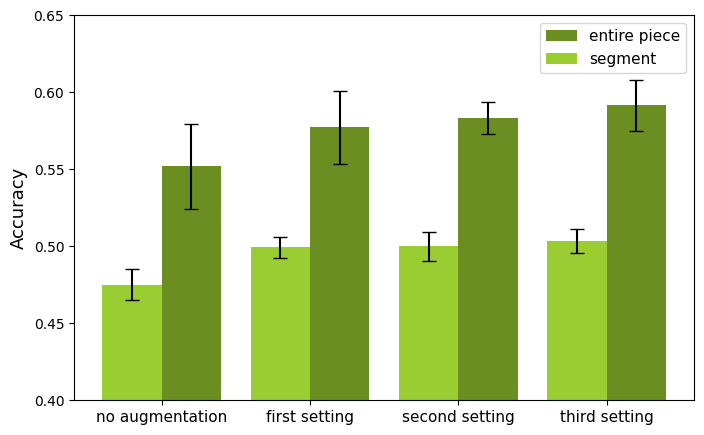

In [ ]:
# new - do it again to change "song" in "piece"
#save_path = '/content/drive/MyDrive/Colab Notebooks/7__emotion_augmentation/1__results/1__compact_results/1__results_10RUN_dataset_x3_low_range_ordered_original_hyperparam_PAPER_v2_legend_piece.pdf'
save_path = '/content/drive/MyDrive/Colab Notebooks/7__emotion_augmentation/1__results/1__compact_results/1__res_10RUN_datas_x3_low_range_ordered_orig_hyperp_PAPER_v2_legen_piece_MULTIPLE.png'


#X_LABELS = ['no augmentation', 'compressor', 'high pass', 'low pass', 'noise addition', 'pitch shift', 'random gain', 'resampling', 'reverb', 'saturation', 'time shift', 'time stretch']
X_LABELS = ['no augmentation', 'first setting', 'second setting', 'third setting']


plot_segm_song_acc_std(X_LABELS, data['song_acc'], data['song_std'], data['segm_acc'] , data['segm_std'], ylim=(0.4, 0.65), no_std=False, save_path=save_path)

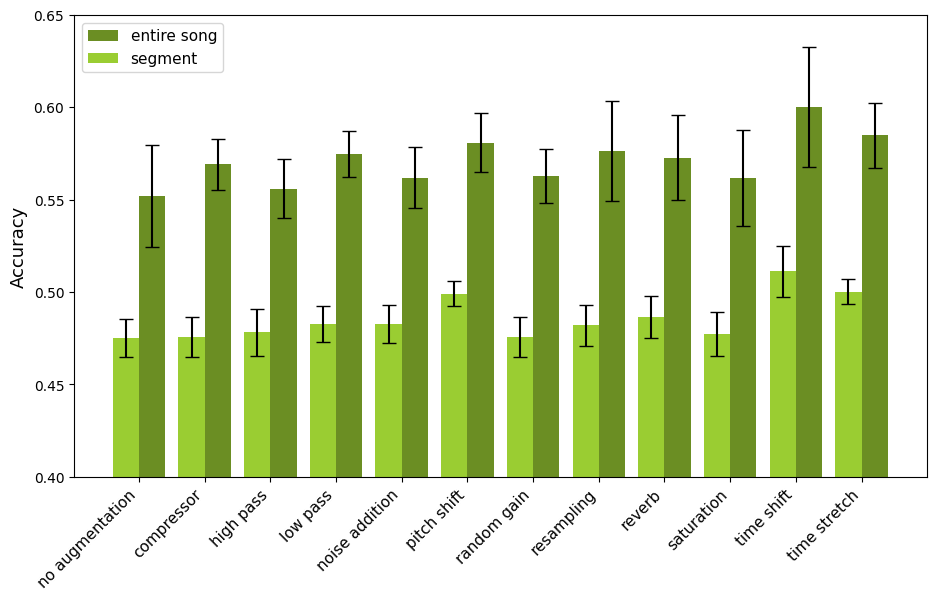

In [ ]:
save_path = '/content/drive/MyDrive/Colab Notebooks/7__emotion_augmentation/1__results/1__compact_results/1__results_10RUN_dataset_x3_low_range_ordered_original_hyperparam_PAPER_v2.pdf'


X_LABELS = ['no augmentation', 'compressor', 'high pass', 'low pass', 'noise addition', 'pitch shift', 'random gain', 'resampling', 'reverb', 'saturation', 'time shift', 'time stretch']
#X_LABELS = ['no augmentation', 'first setting', 'second setting', 'third setting']


plot_segm_song_acc_std(X_LABELS, data['song_acc'], data['song_std'], data['segm_acc'] , data['segm_std'], ylim=(0.4, 0.65), no_std=False, save_path=save_path)

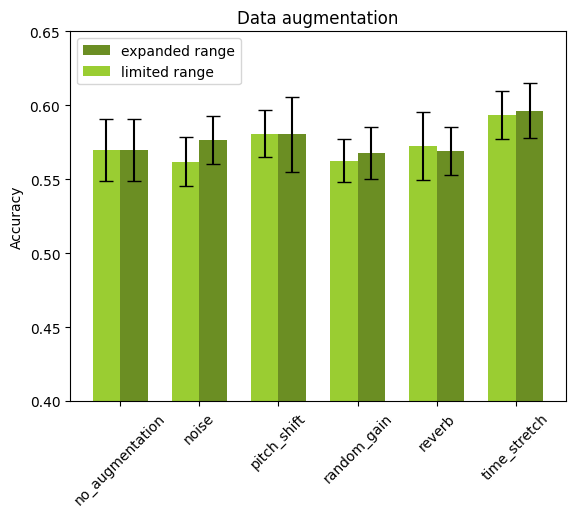

In [ ]:
# high-low comparison

save_path = '/content/drive/MyDrive/Colab Notebooks/7__emotion_augmentation/1__results/1__compact_results/3__results_10RUN_dataset_x3_high_range_comparison.png'
plot_segm_song_acc_std(data['augmentation'], data_high['song_acc'], data_high['song_std'], data_low['song_acc'] , data_low['song_std'], ylim=(0.4, 0.65), save_path=False)

## Test for new data augmentations

In [ ]:
#!pip install pyloudnorm
import pyloudnorm as pyln

def normalize_loudness(audio_file, sr, loudness_level=-26, verbose=False):
    # create BS.1770 meter and get audio loudness
    meter = pyln.Meter(sr)
    loudness = meter.integrated_loudness(audio_file)
    # loudness normalize to -26 dB LUFS
    loudness_normalized_audio = pyln.normalize.loudness(audio_file, loudness, loudness_level)
    if verbose:
        print(f"\nDETAILS OF normalized_audio FUNCTION\n"
              f"- old loudness: {loudness}\n"
              f"- new loudness: {meter.integrated_loudness(loudness_normalized_audio)}")
    return loudness_normalized_audio

normalized_audio_file = normalize_loudness(audio_file, SAMPLING_RATE, loudness_level=-26, verbose=False)

In [ ]:
!pip install pedalboard

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 25.4 MB/s eta 0:00:00


In [ ]:
from IPython.display import Audio
import librosa
from pedalboard import Pedalboard, Reverb

SAMPLING_RATE = 22050

# load audio file
audio_path = '/content/drive/MyDrive/Colab Notebooks/7__emotion_augmentation/audio_test_relaxed.wav'
audio_file, _ = librosa.load(audio_path, sr=22050)


#low_pass_value = 0.5  #np.random.uniform(0, 20 + 1)
board = Pedalboard( [ Reverb()] )
aug_sample = board(audio_file, SAMPLING_RATE)

Audio(data=aug_sample, rate=22050, autoplay=True)


In [ ]:
from IPython.display import Audio
import librosa
import pedalboard
import random

SAMPLING_RATE = 22050

# load audio file
audio_path = '/content/drive/MyDrive/Colab Notebooks/7__emotion_augmentation/audio_test_relaxed.wav'
audio_file, _ = librosa.load(audio_path, sr=22050)

# normalize audio file
normalized_audio_file = normalize_loudness(audio_file, SAMPLING_RATE, loudness_level=-26, verbose=False)

# listen to the audio file
Audio(data=normalized_audio_file, rate=22050, autoplay=True)

In [ ]:
from pedalboard import Pedalboard, LowpassFilter, HighpassFilter, Compressor, Resample, MP3Compressor


#low_pass_value = 0.5  #np.random.uniform(0, 20 + 1)
board = Pedalboard( [ LowpassFilter(cutoff_frequency_hz=50)] )
aug_sample = board(normalized_audio_file, SAMPLING_RATE)

Audio(data=aug_sample, rate=22050, autoplay=True)

In [ ]:
# high-pass
board = Pedalboard( [ HighpassFilter(cutoff_frequency_hz=1000)] )
aug_sample = board(normalized_audio_file, SAMPLING_RATE)

Audio(data=aug_sample, rate=22050, autoplay=True)

In [ ]:
# compression
board = Pedalboard( [ Compressor(threshold_db = -20, ratio = 1.2)] )   # from 1 to 4
aug_sample = board(normalized_audio_file, SAMPLING_RATE)

Audio(data=aug_sample, rate=22050, autoplay=True)

In [ ]:
# Resample
board = Pedalboard( [ Resample(9000)] )
aug_sample = board(normalized_audio_file, SAMPLING_RATE)

Audio(data=aug_sample, rate=22050, autoplay=True)

In [ ]:
# MP3 compression - todo
board = Pedalboard( [ MP3Compressor(vbr_quality = 9.9) ] )
aug_sample = board(normalized_audio_file, SAMPLING_RATE)

Audio(data=aug_sample, rate=22050, autoplay=True)

In [ ]:
# time shift
shift = random.randint(0, int(SAMPLING_RATE * 1.5) )   # max_shift: half of the segment lenght
aug_sample = audio_file[shift:]

Audio(data=aug_sample, rate=22050, autoplay=True)

In [ ]:
# saturation
from pedalboard import Pedalboard, Chorus, Reverb, Distortion, Phaser, Delay, load_plugin

distortion_value = np.random.uniform(0, 20 + 1)
board = Pedalboard( [ Distortion(distortion_value)] )
aug_sample = board(normalized_audio_file, SAMPLING_RATE)

Audio(data=aug_sample, rate=22050, autoplay=True)

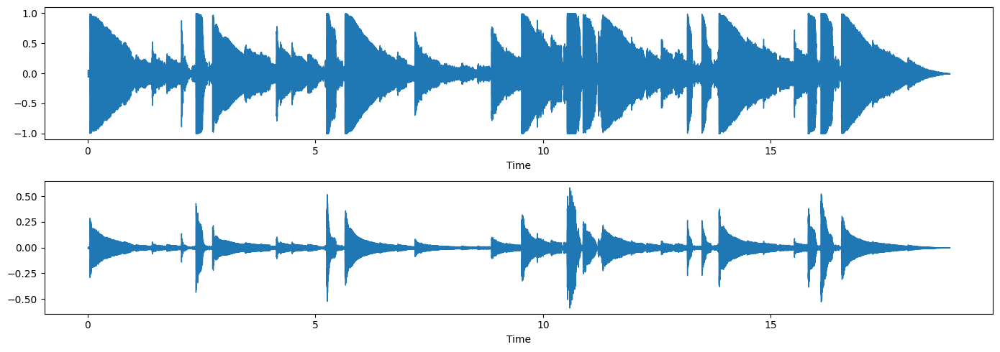

In [ ]:
import matplotlib.pyplot as plt
import librosa.display

# Plot the waveforms
plt.figure(figsize=(14, 5))

# Plot the first waveform
plt.subplot(2, 1, 1)
librosa.display.waveshow(aug_sample, sr=SAMPLING_RATE)

# Plot the second waveform
plt.subplot(2, 1, 2)
librosa.display.waveshow(normalized_audio_file, sr=SAMPLING_RATE)

plt.tight_layout()
plt.show()

In [ ]:
def single_augmentations(X_train_, y_train_, N_train_, augmenation, value_range, dataset_multip=3):

    X_train_aug = []
    y_train_aug = []
    N_train_aug = []

    for sample, label, name in zip(X_train_, y_train_, N_train_):

        # keep the original sample
        X_train_aug.append(sample)
        y_train_aug.append(label)
        N_train_aug.append(name)

        # create (dataset_multip - 1) augmented samples
        for i in range(dataset_multip-1):

            if augmenation == 'pitch_shift':

                # NB: if I want from -3 to 3 i have to set randint(-3, 4)
                interval = np.random.randint(value_range[0], value_range[1] + 1)    # previouis range = (-3, 4) -> -3 semit, +3 semit
                aug_sample = librosa.effects.pitch_shift(y=sample, sr=SAMPLING_RATE, n_steps=interval)


            if augmenation == 'time_stretch':

                stretch = np.random.uniform(value_range[0], value_range[1])   # previouis range = (0.97, 1)
                aug_sample = librosa.effects.time_stretch(y=sample, rate=stretch)
                aug_sample = aug_sample[:len(sample)]


            if augmenation == 'reverb':

                reverb_intensity = np.random.uniform(value_range[0], value_range[1])    # previouis range = (0, 0.1)
                board = Pedalboard( [ Reverb(reverb_intensity)] )
                aug_sample = board(sample, SAMPLING_RATE)


            if augmenation == 'noise':

                noise_factor = np.random.uniform(value_range[0], value_range[1])  # previous fixed values were [0.02, 0.05]
                aug_sample = add_white_noise(signal=sample, noise_percentage_factor=noise_factor)


            if augmenation == 'random_gain':

                gain_factor = np.random.uniform(value_range[0], value_range[1])  # previous fixed values were [0.8, 1.2]
                aug_sample = sample * gain_factor


            if augmenation == 'saturation':

                distortion_value = np.random.uniform(0, 20 + 1)   # it also increases a lot the gain...
                board = Pedalboard( [ Distortion(distortion_value)] )
                aug_sample = board(normalized_audio_file, SAMPLING_RATE)


            if augmenation == 'time_shift':

                shift = random.randint(0, int(SAMPLING_RATE * 1.5) )   # max_shift: half of the segment lenght
                aug_sample = audio_file[shift:]



            # save augmented sample
            X_train_aug.append(aug_sample)
            y_train_aug.append(label)
            N_train_aug.append(name)

    return X_train_aug, y_train_aug, N_train_aug

In [ ]:
distortion_value = np.random.uniform(0, 20 + 1)   # it also increases a lot the gain...
board = Pedalboard( [ Distortion(distortion_value)] )
aug_sample = board(normalized_audio_file, SAMPLING_RATE)

### test multiple augmentation

In [ ]:

# apply best augmentation techniques
shift_range = (0, 1.5)
stretch_range = (0.97, 1.03)
pitch_range = (-3, 3)


if augmentation == 'multiple_1':

    # time shift
    shift = np.random.randint(shift_range[0], int(SAMPLING_RATE * shift_range[1] ) )   # max_shift: half of the segment lenght -> in seconds (0, 1.5)
    aug_sample = sample[shift:]
    # time stretch
    stretch = np.random.uniform(stretch_range[0], stretch_range[1])   # previouis range = (0.97, 1)
    aug_sample = librosa.effects.time_stretch(y=aug_sample, rate=stretch)
    # pitch shift
    interval = np.random.randint(pitch_range[0], pitch_range[1] + 1)    # previouis range = (-3, 4) -> -3 semit, +3 semit
    aug_sample = librosa.effects.pitch_shift(y=aug_sample, sr=SAMPLING_RATE, n_steps=interval)


if augmentation == 'multiple_2':

    # decide which is activated and which is not randomply
    aug_sample = sample
    # time shift
    if np.random.random() > 0.5:
        shift = np.random.randint(shift_range[0], int(SAMPLING_RATE * shift_range[1] ) )   # max_shift: half of the segment lenght -> in seconds (0, 1.5)
        aug_sample = aug_sample[shift:]

    # time stretch
    if np.random.random() > 0.5:
        stretch = np.random.uniform(stretch_range[0], stretch_range[1])   # previouis range = (0.97, 1.03)
        aug_sample = librosa.effects.time_stretch(y=aug_sample, rate=stretch)

    # pitch shift
    if np.random.random() > 0.5:
        interval = np.random.randint(pitch_range[0], pitch_range[1] + 1)    # previouis range = (-3, 4) -> -3 semit, +3 semit
        aug_sample = librosa.effects.pitch_shift(y=aug_sample, sr=SAMPLING_RATE, n_steps=interval)


if augmentation == 'multiple_3':

    possible_augm = ['t_shift', 't_stretch', 'pitch_s']
    probab = [1/3, 1/3, 1/3]
    chose_augmentation = np.random.choice(possible_augm, p=probab)

    if chose_augmentation=='t_shift':
        shift = np.random.randint(shift_range[0], int(SAMPLING_RATE * shift_range[1] ) )   # max_shift: half of the segment lenght -> in seconds (0, 1.5)
        aug_sample = sample[shift:]

    if chose_augmentation=='t_stretch':
        stretch = np.random.uniform(stretch_range[0], stretch_range[1])   # previouis range = (0.97, 1.03)
        aug_sample = librosa.effects.time_stretch(y=sample, rate=stretch)

    if chose_augmentation=='pitch_s':
        interval = np.random.randint(pitch_range[0], pitch_range[1] + 1)    # previouis range = (-3, 4) -> -3 semit, +3 semit
        aug_sample = librosa.effects.pitch_shift(y=sample, sr=SAMPLING_RATE, n_steps=interval)





In [ ]:
possible_augm = ['t_shift', 't_stretch', 'pitch_s']
probab = [1/3, 1/3, 1/3]
chose_augmentation = np.random.choice(possible_augm, p=probab)
chose_augmentation

'pitch_s'

In [ ]:
import numpy as np

def choose_action():
    actions = ['Action 1', 'Action 2', 'Action 3']
    probabilities = [1/3, 1/3, 1/3]
    return np.random.choice(actions, p=probabilities)

result = choose_action()
print("The chosen action is:", result)


The chosen action is: Action 1


## Statistical Tests

In [ ]:
import json
import os
import numpy as np

#path_all_stats = '/content/drive/MyDrive/Colab Notebooks/7__emotion_augmentation/1__results/1b_dataset_x3_low_range_all_stats/multiple'
#path_all_stats = '/content/drive/MyDrive/Colab Notebooks/7__emotion_augmentation/1__results/1b_dataset_x3_low_range_all_stats'
path_all_stats = '/content/drive/MyDrive/Colab Notebooks/7__emotion_augmentation/1__results/1b_dataset_x3_low_range_all_stats/stat_test'

#AUGM_TECHNIQUES = ['no_augm_x3', 'no_aug_x1', 'compressor', 'high_pass', 'low_pass', 'noise', 'pitch_shift', 'random_gain', 'resampling', 'reverb', 'saturation', 'time_shift', 'time_stretch', 'time_stretch_extended', 'multiple_1', 'multiple_2', 'multiple_3']
#RANGES =          [(0, 0), (0, 0), (1, 4), (200, 2000), (500, 5000), (0, 0.05), (-3, 3), (0.8, 1.2), (11025, 22050), (0, 0.1), (0, 20), (0, 1.5), (0.97, 1), (0.97, 1.03), (0, 0), (0, 0), (0, 0)]

#AUGM_TECHNIQUES = ['no_augmentation', 'multiple_1', 'multiple_2', 'multiple_3']
#RANGES =          [(0, 0), (0, 0), (0, 0), (0, 0)]


AUGM_TECHNIQUES = ['no_augm_x3', 'compressor', 'high_pass', 'low_pass', 'noise', 'pitch_shift', 'random_gain', 'resampling', 'reverb', 'saturation', 'time_shift', 'time_stretch_extended', 'multiple_1', 'multiple_2', 'multiple_3']

AUGM_TECHNIQUES = ['no augmentation', 'compressor', 'high pass', 'low pass', 'noise addition', 'pitch shift', 'random gain', 'resampling', 'reverb', 'saturation', 'time shift', 'time stretch', 'multiple (first)', 'multiple (second)', 'multiple (third)']

RANGES =          [(0, 0), (1, 4), (200, 2000), (500, 5000), (0, 0.05), (-3, 3), (0.8, 1.2), (11025, 22050), (0, 0.1), (0, 20), (0, 1.5), (0.97, 1.03), (0, 0), (0, 0), (0, 0)]

# function

def get_accuracy_and_std_from_string(text, verbose=False):

  # get song and segment lines
  song_line = single_run.split('\n')[4]
  segm_line = single_run.split('\n')[5]

  # find song and segment accuracy
  song_acc = round( float( song_line.split('song: ')[1][:6] ), 5 )
  segm_acc = round( float( segm_line.split('segm: ')[1][:6] ), 5 )

  #find song and segment std
  song_std = round( float( song_line.split('std: ')[1][:6] ), 5 )
  segm_std = round( float( segm_line.split('std: ')[1][:6] ), 5 )

  if verbose:

    print( f'acc segm (std): {segm_acc} ({segm_std})')
    print( f'acc song (std): {song_acc} ({song_std})')

  return song_acc, song_std, segm_acc, segm_std



# NEW - GET RESULTS FOR STATISTICAL TESTS


# each element in song_accs is a list of 10 runs for that augmentation technique
dict_for_test = {
    'augmentation': AUGM_TECHNIQUES,
    'song_accs': [],
    'segm_accs': []
}



for i, (path, folders, files) in enumerate(os.walk(path_all_stats)):

  # to not consider the folder in 1_results that contains other material
  if path is path_all_stats:

    # sort files alphabetically
    sorted_files = sorted(files)

    # iterate through all the files
    for file_name, augm_tech in zip(sorted_files, dict_for_test['augmentation']):

      # verify correspondence technique .json file
      print(augm_tech, ' --- ' ,file_name)




      # get complete path of each .json file
      file_path = os.path.join(path, file_name)

      # open file, get data and store in a list
      with open(file_path, 'r') as f:
        data = json.load(f)

      song_acc_list = []
      segm_acc_list = []


      # get accuracy (std) for song and segments
      for single_run in data:

        # print(single_run)

        # save all the accuracies for a specific tecnique
        song_acc, song_std, segm_acc, segm_std = get_accuracy_and_std_from_string(single_run, verbose=False)
        song_acc_list.append(song_acc)
        segm_acc_list.append(segm_acc)

      # save list for this specific augm technique
      dict_for_test['song_accs'].append(song_acc_list.copy())
      dict_for_test['segm_accs'].append(segm_acc_list.copy())


from pprint import pprint
#pprint( dict_for_test, sort_dicts=False )

no augmentation  ---  Copia di a_new_dataset_x3_10RUN_no_augmentation_range_(0, 0)_3fold_stratif_grouped_random_st_1.json
compressor  ---  Copia di dataset_x3_10RUN_compressor_range_(1, 4)_3fold_stratif_grouped_random_st_1.json
high pass  ---  Copia di dataset_x3_10RUN_high_pass_range_(200, 2000)_3fold_stratif_grouped_random_st_1.json
low pass  ---  Copia di dataset_x3_10RUN_low_pass_range_(500, 5000)_3fold_stratif_grouped_random_st_1.json
noise addition  ---  Copia di dataset_x3_10RUN_noise_range_(0, 0.05)_3fold_stratif_grouped_random_st_1.json
pitch shift  ---  Copia di dataset_x3_10RUN_pitch_shift_range_(-3, 3)_3fold_stratif_grouped_random_st_1.json
random gain  ---  Copia di dataset_x3_10RUN_random_gain_range_(0.8, 1.2)_3fold_stratif_grouped_random_st_1.json
resampling  ---  Copia di dataset_x3_10RUN_resampling_range_(11025, 22050)_3fold_stratif_grouped_random_st_1.json
reverb  ---  Copia di dataset_x3_10RUN_reverb_range_(0, 0.1)_3fold_stratif_grouped_random_st_1.json
saturation  -

In [ ]:
# convert into pandas dataframe to be used with autorank

import pandas as pd

data = pd.DataFrame()

#AUGMENATIONS =

for technique, segm_accs, song_accs in zip(dict_for_test['augmentation'], dict_for_test['segm_accs'], dict_for_test['song_accs']):

    data[technique] = segm_accs


In [ ]:
from scipy import stats

In [ ]:
!pip install autorank

  Preparing metadata (setup.py) ... done
  Created wheel for baycomp: filename=baycomp-1.0.3-py3-none-any.whl size=18026 sha256=f1d0e35a8159cbddce7ce65c367c3053aa7423b852edb7e09dea0c00ce79b362
  Stored in directory: /root/.cache/pip/wheels/8a/aa/61/8f1e79a2be629eaa2a72b495c56bb667568dac7c33f4e4c408
Successfully built baycomp


In [ ]:
# use autorank to make the statistical tests
from autorank import autorank, plot_stats, create_report, latex_table

results = autorank(data, alpha=0.05, verbose=False)
print(results)



RankResult(rankdf=
                   meanrank     mean       std  ci_lower  ci_upper  \
compressor            11.90  0.47572  0.011427  0.467431  0.484009   
no augmentation       11.75  0.47509  0.010665  0.466801  0.483379   
random gain           11.70  0.47568  0.011144  0.467391  0.483969   
high pass             11.20  0.47819  0.013411  0.469901  0.486479   
saturation            10.95  0.47724  0.012451  0.468951  0.485529   
resampling            10.50  0.48208  0.011748  0.473791  0.490369   
noise addition        10.10  0.48248  0.010837  0.474191  0.490769   
low pass               9.80  0.48253  0.010275  0.474241  0.490819   
reverb                 9.05  0.48662  0.011815  0.478331  0.494909   
pitch shift            4.50  0.49922  0.006893  0.490931  0.507509   
multiple (second)      4.30  0.49998  0.009959  0.491691  0.508269   
multiple (first)       4.25  0.49938  0.007153  0.491091  0.507669   
time stretch           3.75  0.50029  0.006975  0.492001  0.508579   
m

In [ ]:
create_report(results)

The statistical analysis was conducted for 15 populations with 10 paired samples.
The family-wise significance level of the tests is alpha=0.050.
We failed to reject the null hypothesis that the population is normal for all populations (minimal observed p-value=0.067). Therefore, we assume that all populations are normal.
We applied Bartlett's test for homogeneity and failed to reject the null hypothesis (p=0.596) that the data is homoscedastic. Thus, we assume that our data is homoscedastic.
Because we have more than two populations and all populations are normal and homoscedastic, we use repeated measures ANOVA as omnibus test to determine if there are any significant differences between the mean values of the populations. If the results of the ANOVA test are significant, we use the post-hoc Tukey HSD test to infer which differences are significant. We report the mean value (M) and the standard deviation (SD) for each population. Populations are significantly different if their confi

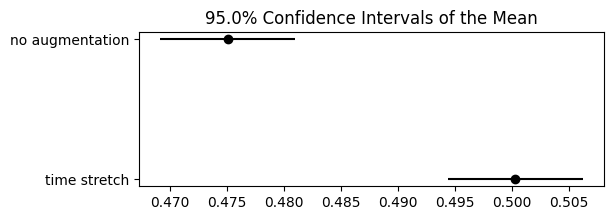

In [ ]:
#fig, ax = plt.subplots(figsize=(10, 6))  # Adjust the width and height as needed
#plot_stats(results, ax=ax)
plot_stats(results)

#save_path = '/content/drive/MyDrive/Colab Notebooks/7__emotion_augmentation/1__results/1__compact_results/aaa.pdf'
#plt.savefig(save_path, bbox_inches='tight')

plt.show()

In [ ]:
import matplotlib.pyplot as plt

#plt.figure(figsize=(8, 20))

plot_stats(results)

#plt.show()

In [ ]:
latex_table(results)

\begin{table}[h]
\centering
\begin{tabular}{lrrrlll}
\toprule
 & MR & M & SD & CI & $d$ & Magnitude \\
\midrule
no augmentation & 2.000 & 0.475 & 0.011 & [0.466, 0.484] & 0.000 & negligible \\
time stretch & 1.000 & 0.500 & 0.007 & [0.494, 0.506] & -2.796 & large \\
\bottomrule
\end{tabular}
\caption{Summary of populations}
\label{tbl:stat_results}
\end{table}
